In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2

os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [3]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage2')

In [4]:
# First define some input and output directory paths.

uncal_indir = '/data/typhon2/hattie/jwst/wasp_63/DMS_uncal/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [5]:
observation_id = "jw02113005001"

In [6]:
filenames = [
    f"{uncal_indir}{observation_id}_04102_00001-seg001_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg002_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg003_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg004_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg005_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg006_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg007_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04102_00001-seg008_nis_uncal.fits",
]

In [7]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 1493
No. groups: 4
subarray: SUBSTRIP256


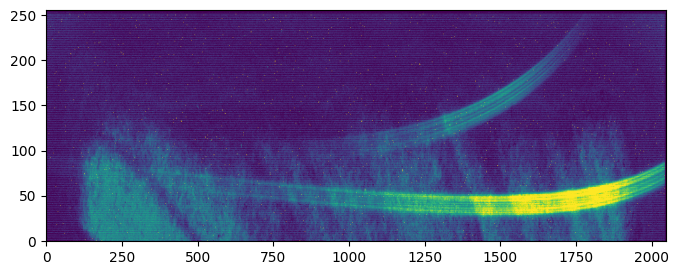

'/data/typhon2/hattie/jwst/wasp_63/DMS_uncal/jw02113005001_04102_00001-seg001_nis_uncal.fits'

In [8]:
plot_spectrum(filenames[0])

In [9]:
step = stage1.DQInitStep(filenames, deepframe=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:40:17,288 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:40:18,104 - CRDS - INFO -  Calibration SW Found: jwst 1.12.5 (/home/bi19158/Code/soss-data-reduction/venv/lib/python3.10/site-packages/jwst-1.12.5.dist-info)
2025-08-20 10:40:18,647 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:40:18,820 - stpipe.DQInitStep - INFO - Step DQInitStep running with args (<Level1bModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_uncal.fits>,).
2025-08-20 10:40:18,823 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:40:19,083 - stpipe.DQInitStep - INFO - Using MASK reference file ./crds_cache/reference

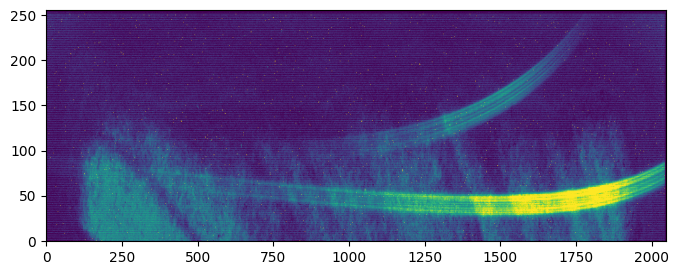

In [10]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [11]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:41:03,893 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:41:03,915 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:41:04,076 - stpipe.SaturationStep - INFO - Step SaturationStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_dqinitstep.fits>,).
2025-08-20 10:41:04,078 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
2025-08-20 10:41:04,115 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2025-08-20 10:41:04,188 - stpipe.SaturationStep - WARNING - K

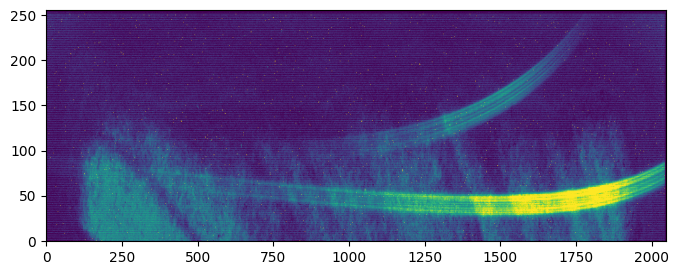

In [12]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [13]:
saturation_step_files = [
    f"{outdir_s1}{observation_id}_04102_00001-seg001_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg002_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg003_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg004_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg005_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg006_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg007_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04102_00001-seg008_nis_saturationstep.fits",
]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 10:43:48,111 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:43:48,134 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:43:48,302 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_saturationstep.fits>,).
2025-08-20 10:43:48,305 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:43:48,342 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0181.fits
2025-08-20 10:43:49,304 - stpipe.SuperBiasStep - INFO - Results used CRDS context: jwst_

2025-08-20 10:45:22.677 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 10:46:06.235 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/superbiasstep.png


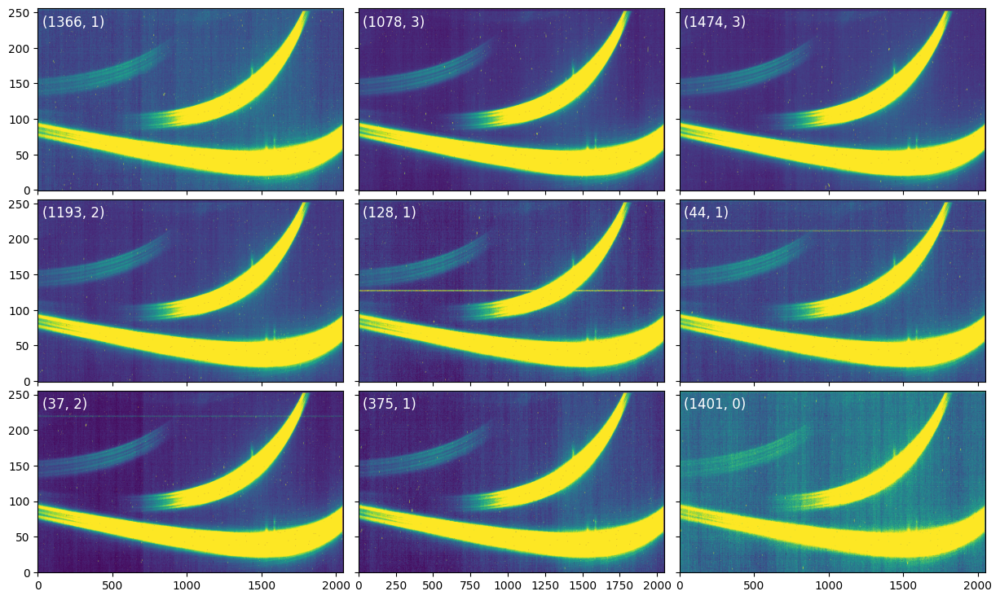

In [14]:
Image(filename=outdir_s1 + 'superbiasstep_1.png')

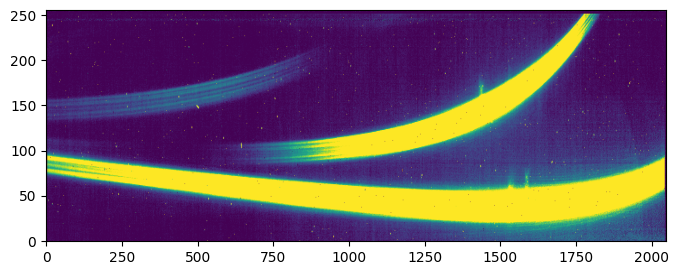

In [15]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [16]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:46:07,605 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:46:07,626 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:46:07,812 - stpipe.RefPixStep - INFO - Step RefPixStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_superbiasstep.fits>,).
2025-08-20 10:46:07,815 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0
2025-08-20 10:46:08,389 - stpipe.RefPixStep - INFO - NIR subarray data
2025-08-20 10:46:08,393 - stpipe.RefPixStep - 

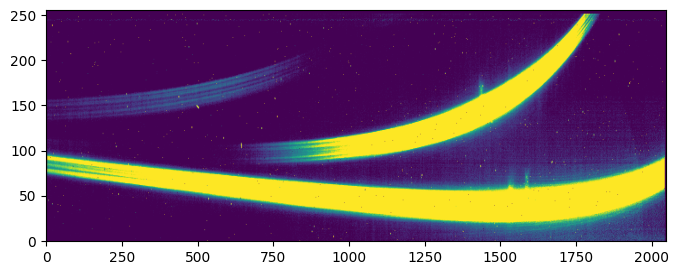

In [17]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [18]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:47:23,655 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:47:23,677 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:47:23,845 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_refpixstep.fits>,).
2025-08-20 10:47:23,848 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None
2025-08-20 10:47:23,885 - stpipe.DarkCurrentStep - INFO - Using DARK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_dark_0171.fits
2025-08-20 10:47:24,010 - stpipe.DarkCurrentStep - INFO - Scienc

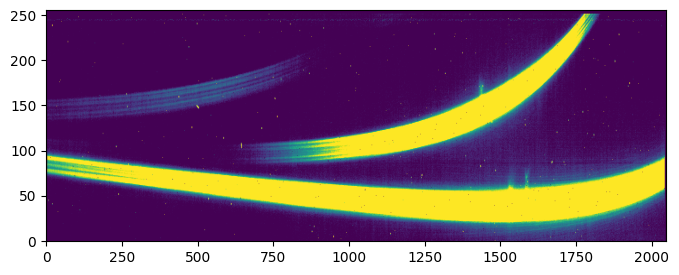

'/data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/jw02113005001_04102_00001-seg001_nis_darkcurrentstep.fits'

In [19]:
plot_spectrum(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [20]:
background_model = np.load("model_background256.npy")

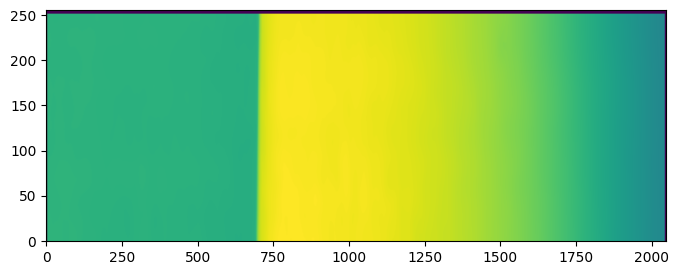

In [21]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [22]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2025-08-20 10:48:23.851 - exoTEDRF - INFO - BackgroundStep instance created.
2025-08-20 10:53:29.824 - exoTEDRF - INFO - Starting background subtraction step.
2025-08-20 10:56:32.095 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2025-08-20 10:57:26.350 - exoTEDRF - INFO - Calculating background model scaling.
2025-08-20 10:57:26.354 - exoTEDRF - INFO - Using differential background scale factors: 0.00418, 0.92982, and shift: 34.03921
2025-08-20 10:57:26.362 - exoTEDRF - INFO - Using differential background scale factors: 0.00104, 2.57449, and shift: 18.05103
2025-08-20 10:57:26.370 - exoTEDRF - INFO - Using differential background scale factors: 0.00060, 4.27514, and shift: 3.07515
2025-08-20 10:57:26.375 - exoTEDRF - INFO - Using differential background scale factors: 2.63131, 7.34720, and shift: 0.00000
2025-08-20 10:58:10.186 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 10:58:19.410 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/was

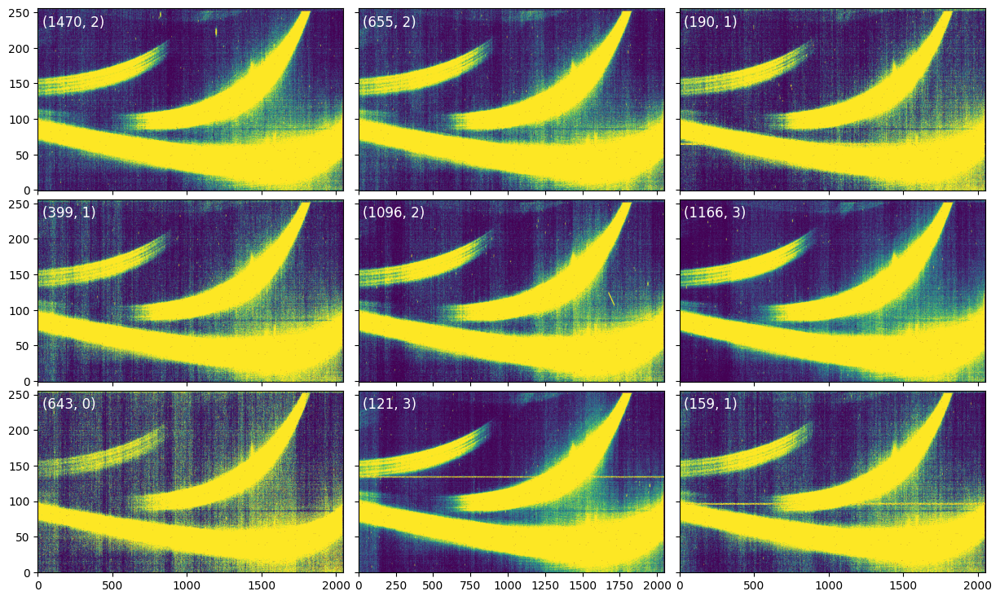

In [23]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

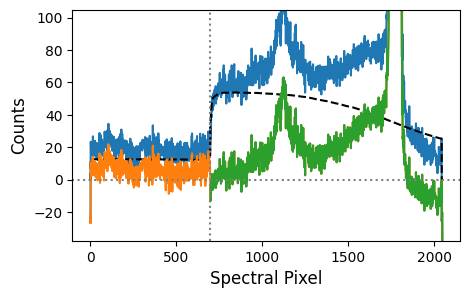

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')

In [25]:
pixel_masks = None
timeseries = None
step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40)

2025-08-20 10:58:40.151 - exoTEDRF - INFO - OneOverFStep instance created.
2025-08-20 10:58:57.852 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-20 10:59:05.461 - exoTEDRF - INFO - Generating a deep stack for each group using baseline integrations.


2025-08-20 11:00:01,931 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2025-08-20 11:00:01.928 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2025-08-20 11:00:02.533 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-20 11:00:03.309 - exoTEDRF - INFO - Constructing trace mask.
2025-08-20 11:00:04.111 - exoTEDRF - INFO - Flagging additional outliers.


2025-08-20 11:10:07.973 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-20 11:10:09.709 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 1493/1493 [00:53<00:00, 28.01it/s]


2025-08-20 11:12:03.144 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:13:04.742 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2025-08-20 11:13:04.767 - exoTEDRF - INFO - Doing diagnostic plot 2.


100%|██████████| 25/25 [01:59<00:00,  4.80s/it]


2025-08-20 11:17:47.753 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2025-08-20 11:17:47.754 - exoTEDRF - INFO - Step OneOverFStep done.


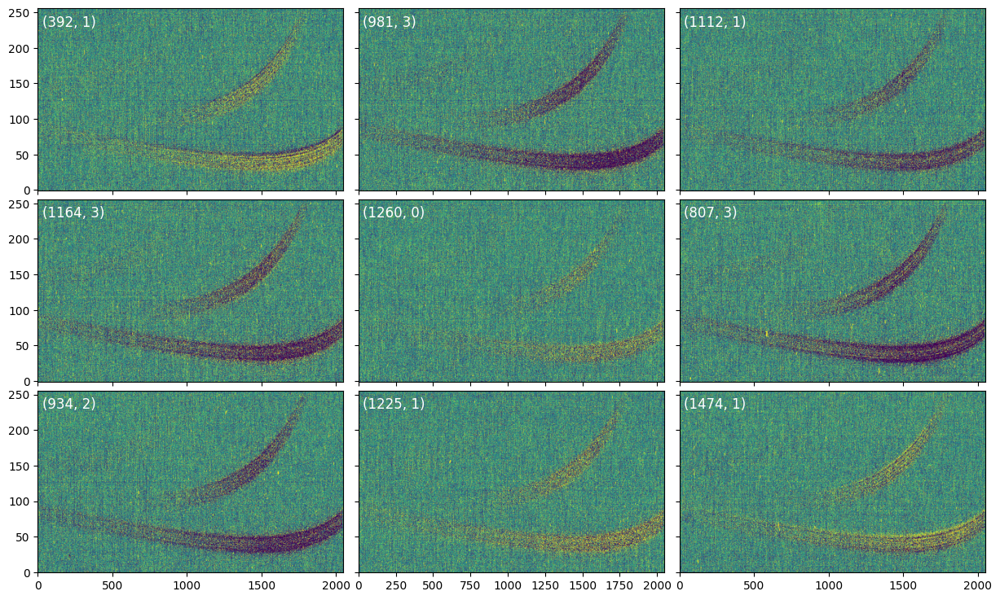

In [26]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')



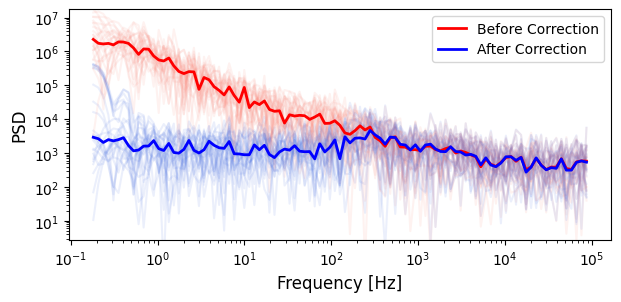

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [28]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 11:17:48,734 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:17:48,754 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:17:49,149 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_oneoverfstep.fits>,).
2025-08-20 11:17:49,152 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 11:17:49,188 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-20 11:17:49,318 - stpipe.LinearityStep - WARNING - Keyword LOWILLUM does not corre

2025-08-20 11:18:25,404 - stpipe.LinearityStep - INFO - Saved model in /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/jw02113005001_04102_00001-seg003_nis_oneoverfstep_linearitystep.fits
2025-08-20 11:18:25,405 - stpipe.LinearityStep - INFO - Step LinearityStep done
2025-08-20 11:18:30,776 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:18:30,798 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 11:18:30,978 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg004_nis_oneoverfstep.fits>,).
2025-08-20 11:18:30,980 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None


2025-08-20 11:19:46.797 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 11:20:04.206 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/linearitystep_1.png
2025-08-20 11:20:04.263 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-20 11:21:41.351 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/linearitystep_2.png


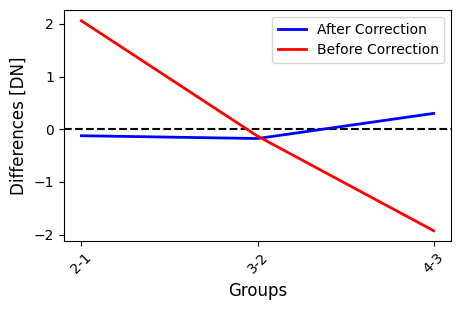

In [29]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



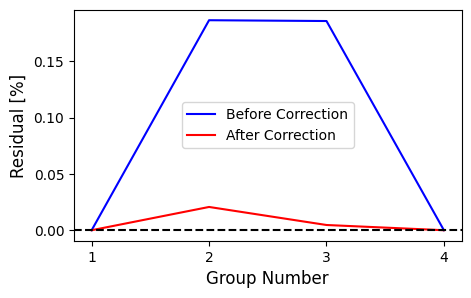

In [30]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [31]:
# linearity_step_files = [
#     f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_linearitystep.fits",
#     f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_linearitystep.fits",
# ]

step = stage1.JumpStep(results, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2025-08-20 11:21:43.823 - exoTEDRF - INFO - Starting time-domain jump detection step.


  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [11:28<00:00, 172.03s/it]


2025-08-20 11:33:12.094 - exoTEDRF - INFO - 210198 jumps flagged
2025-08-20 11:33:12.094 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:33:16.187 - exoTEDRF - INFO - Done
2025-08-20 11:33:16.211 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:34<00:00, 173.51s/it]


2025-08-20 11:44:50.401 - exoTEDRF - INFO - 216561 jumps flagged
2025-08-20 11:44:50.401 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:44:54.434 - exoTEDRF - INFO - Done
2025-08-20 11:44:54.457 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:33<00:00, 173.39s/it]


2025-08-20 11:56:28.164 - exoTEDRF - INFO - 211059 jumps flagged
2025-08-20 11:56:28.164 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:56:32.206 - exoTEDRF - INFO - Done
2025-08-20 11:56:32.229 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:42<00:00, 175.50s/it]


2025-08-20 12:08:14.364 - exoTEDRF - INFO - 206007 jumps flagged
2025-08-20 12:08:14.364 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:08:18.394 - exoTEDRF - INFO - Done
2025-08-20 12:08:18.417 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:33<00:00, 173.29s/it]


2025-08-20 12:19:51.724 - exoTEDRF - INFO - 206826 jumps flagged
2025-08-20 12:19:51.724 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:19:55.882 - exoTEDRF - INFO - Done
2025-08-20 12:19:55.906 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:33<00:00, 173.45s/it]


2025-08-20 12:31:29.817 - exoTEDRF - INFO - 204877 jumps flagged
2025-08-20 12:31:29.817 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:31:33.856 - exoTEDRF - INFO - Done
2025-08-20 12:31:33.880 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [11:29<00:00, 172.48s/it]


2025-08-20 12:43:03.920 - exoTEDRF - INFO - 211385 jumps flagged
2025-08-20 12:43:03.920 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:43:07.981 - exoTEDRF - INFO - Done
2025-08-20 12:43:08.005 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 4/4 [09:57<00:00, 149.30s/it]


2025-08-20 12:53:05.323 - exoTEDRF - INFO - 180701 jumps flagged
2025-08-20 12:53:05.323 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 12:53:09.234 - exoTEDRF - INFO - Done
2025-08-20 12:53:09.239 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 12:54:07.164 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/jump.png
2025-08-20 12:54:07.194 - exoTEDRF - INFO - Step JumpStep done.


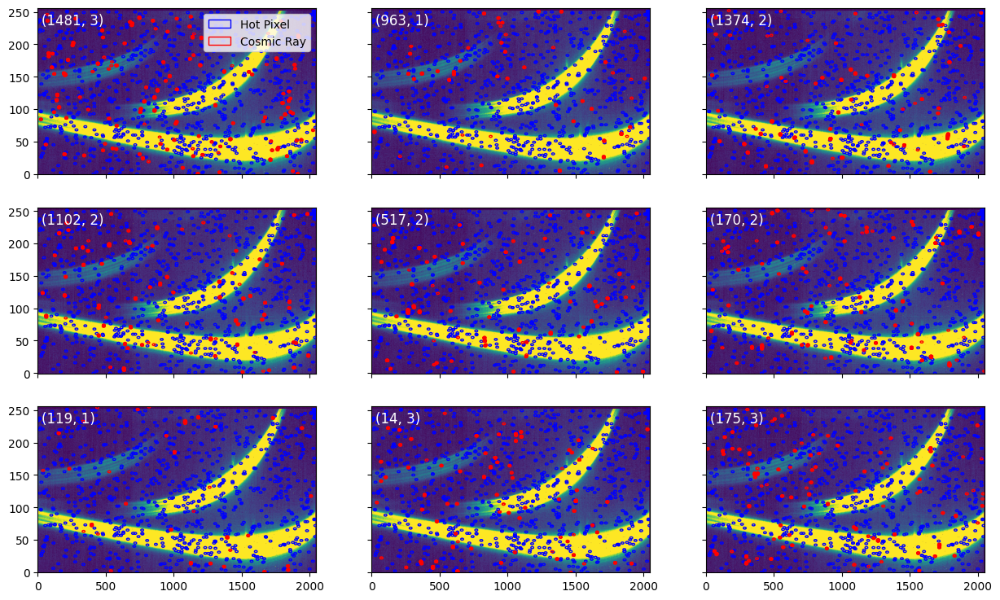

In [32]:
Image(filename=outdir_s1 + 'jump.png')

In [ ]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 12:54:08,991 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:54:09,011 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:54:09,906 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg001_nis_jump.fits>,).
2025-08-20 12:54:09,910 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:54:09,965 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:5

2025-08-20 12:54:58.123 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:56:39,863 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:56:39,884 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:56:40,083 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg002_nis_jump.fits>,).
2025-08-20 12:56:40,087 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:56:40,142 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:5

2025-08-20 12:57:30.878 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:59:12,701 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:59:12,723 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:59:12,925 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg003_nis_jump.fits>,).
2025-08-20 12:59:12,928 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:59:12,984 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:5

2025-08-20 13:00:09.852 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:01:51,677 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:01:51,699 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:01:51,901 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg004_nis_jump.fits>,).
2025-08-20 13:01:51,904 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:01:51,961 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:02:47.321 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:04:33,519 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:04:33,541 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:04:33,744 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg005_nis_jump.fits>,).
2025-08-20 13:04:33,747 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:04:33,802 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:05:33.777 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:07:15,610 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:07:15,635 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:07:15,855 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg006_nis_jump.fits>,).
2025-08-20 13:07:15,858 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:07:15,922 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:0

2025-08-20 13:08:18.565 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:10:00,044 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:10:00,065 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:10:00,268 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(190, 4, 256, 2048) from jw02113005001_04102_00001-seg007_nis_jump.fits>,).
2025-08-20 13:10:00,270 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:10:00,325 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:1

2025-08-20 13:10:50.193 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 13:12:31,673 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:12:31,694 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 13:12:31,903 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(163, 4, 256, 2048) from jw02113005001_04102_00001-seg008_nis_jump.fits>,).
2025-08-20 13:12:31,906 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_63/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 13:12:31,962 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 13:1

2025-08-20 13:13:13.267 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


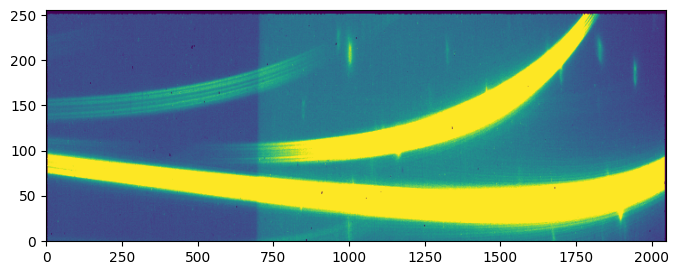

In [ ]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()

In [ ]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2025-08-09 14:30:02,263 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-09 14:30:02,939 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-09 14:30:03,130 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args ('/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/jw01366001001_04101_00001-seg001_nis_rampfitstep.fits',).
2025-08-09 14:30:03,133 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-09 14:30:03,964 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2025-08-09 14:30:03,964 - stpipe.GainScaleStep - INFO - Step will be skipped
2025-08-09 14:30:03,967 - stpipe.Gain

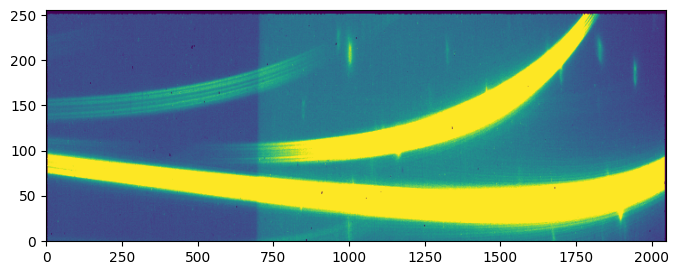

In [ ]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04102_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()